To access the Google Drive 

In [1]:
##### Import thr drive liabries #####
from google.colab import drive
def accessGoogleDrive(parameter = None):
  if parameter == 'active':
    drive.mount('/content/drive')
  else:
    raise Exception('Try again')

##### Call this 'accessGoogleDrive' function from this current directory #####
if __name__ == "__main__":
  try:
    accessGoogleDrive('active')
  except Exception as e:
    print(e.with_traceback)
  else:
    print('Drive access successfully.'.capitalize())

Mounted at /content/drive
Drive access successfully.


To Unzip the dataset

In [2]:
##### Go to the Yolov5setup directory and unzip the dataset #####
%cd /content/drive/MyDrive/Yolov5setup/
!unzip dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: dataset/train/images/2914fe18-387e-4d7f-8580-a0b530d7e727___Crnl_L-Mold-6777_JPG_jpg.rf.1f95cfb8c0bc12517df514e1a6b2e2cf.jpg  
  inflating: dataset/train/images/29345423-647e-4e1b-81f4-16d8cfc0e137___RS_Erly-B-7422_JPG_jpg.rf.d5cb683b194b84a84e319cbeb739d18c.jpg  
  inflating: dataset/train/images/2960d2b0-5db9-4112-89f6-c7c0d2f01b97___Com-G_SpM_FL-8806_JPG_jpg.rf.69e76bf120c79a1345d8ae6e0d230574.jpg  
  inflating: dataset/train/images/297feea8-4707-4d39-a6af-b1c0e3403935___RS_Erly-B-7816_JPG_jpg.rf.f17918a876d016bc9fa7ba9de36fbbce.jpg  
  inflating: dataset/train/images/29919d99-e33e-43f0-b313-73eef0221636___Com-G_SpM_FL-1673_JPG_jpg.rf.8c6c991950539ea5101e2f7137b4ed9b.jpg  
  inflating: dataset/train/images/2998c7f2-9f4f-4734-aa39-403dd7211869___RS_Erly-B-7528_JPG_jpg.rf.737d3d4109cd7cec5b6555eb2ff09afc.jpg  
  inflating: dataset/train/images/29e36e1e-0857-4985-8d33-505290dff591___RS_Erly-B-6343_JPG_jpg.rf.8d523709261bb1

#Install Dependencies

_(Remember to choose GPU in Runtime if not already selected. Runtime --> Change Runtime Type --> Hardware accelerator --> GPU)_

In [4]:
##### clone YOLOv5 repository #####
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 15123, done.
remote: Counting objects: 100% (78/78), done.
remote: Compressing objects: 100% (66/66), done.
remote: Total 15123 (delta 42), reused 33 (delta 12), pack-reused 15045
Receiving objects: 100% (15123/15123), 14.19 MiB | 8.73 MiB/s, done.
Resolving deltas: 100% (10353/10353), done.
/content/drive/MyDrive/Yolov5setup/yolov5/yolov5


In [5]:
##### install dependencies as necessary #####
!pip install -qr requirements.txt  
##### install dependencies (ignore errors) #####

##### Check the data yaml works or not #####

In [8]:
try:
  # this is the YAML file
  %cat /content/drive/MyDrive/Yolov5setup/dataset/data.yaml
except Exception as e:
  print(e.with_traceback)

train: /content/drive/MyDrive/Yolov5setup/dataset/train/images
val: /content/drive/MyDrive/Yolov5setup/dataset/test/images

nc: 12
names: ['Beans_Angular_LeafSpot', 'Beans_Rust', 'Strawberry_Angular_LeafSpot', 'Strawberry_Anthracnose_Fruit_Rot', 'Strawberry_Blossom_Blight', 'Strawberry_Gray_Mold', 'Strawberry_Leaf_Spot', 'Strawberry_Powdery_Mildew_Fruit', 'Strawberry_Powdery_Mildew_Leaf', 'Tomato_Blight', 'Tomato_Leaf_Mold', 'Tomato_Spider_Mites']


# Define Model Configuration and Architecture

We will write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.

You do not need to edit these cells, but you may.

In [9]:
# define number of classes based on YAML
import yaml
with open("/content/drive/MyDrive/Yolov5setup/dataset/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [10]:
#this is the model configuration we will use for our tutorial 
%cat /content/drive/MyDrive/Yolov5setup/yolov5/models/yolov5m.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.67  # model depth multiple
width_multiple: 0.75  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [11]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [12]:
##### Create custom_yolo5m.yml in the directory of models #####
%%writetemplate /content/drive/MyDrive/Yolov5setup/yolov5/models/custom_yolov5m.yaml

##### parameters #####
nc: {num_classes}  # number of classes
depth_multiple: 0.67  # model depth multiple
width_multiple: 0.75  # layer channel multiple

##### anchors #####
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

##### YOLOv5 backbone #####
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

##### YOLOv5 head #####
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Train Custom YOLOv5 Detector

### Next, we'll fire off training!


Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive [folder](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J))
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [13]:
##### Check data.yml works or not #####
!cat /content/drive/MyDrive/Yolov5setup/dataset/data.yaml

train: /content/drive/MyDrive/Yolov5setup/dataset/train/images
val: /content/drive/MyDrive/Yolov5setup/dataset/test/images

nc: 12
names: ['Beans_Angular_LeafSpot', 'Beans_Rust', 'Strawberry_Angular_LeafSpot', 'Strawberry_Anthracnose_Fruit_Rot', 'Strawberry_Blossom_Blight', 'Strawberry_Gray_Mold', 'Strawberry_Leaf_Spot', 'Strawberry_Powdery_Mildew_Fruit', 'Strawberry_Powdery_Mildew_Leaf', 'Tomato_Blight', 'Tomato_Leaf_Mold', 'Tomato_Spider_Mites']


Training the model 

In [14]:
##### train yolov5s on custom data for 100 epochs #####
##### time its performance #####
%%time
%cd /content/drive/MyDrive/yolov5setup/yolov5
!python train.py --img 416 --batch 16 --epochs 100 --data '/content/drive/MyDrive/Yolov5setup/dataset/data.yaml'\
 --cfg /content/drive/MyDrive/Yolov5setup/yolov5/models/custom_yolov5m.yaml\
  --weights '' --name yolov5m_results

/content/drive/MyDrive/yolov5setup/yolov5
train: weights=, cfg=/content/drive/MyDrive/Yolov5setup/yolov5/models/custom_yolov5m.yaml, data=/content/drive/MyDrive/Yolov5setup/dataset/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5m_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
Command 'git fetch origin' timed out after 5 seconds
YOLOv5 🚀 v7.0-97-gfa4bdbe Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warm

Evaluate Custom YOLOv5 Detector Performance:

In [15]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

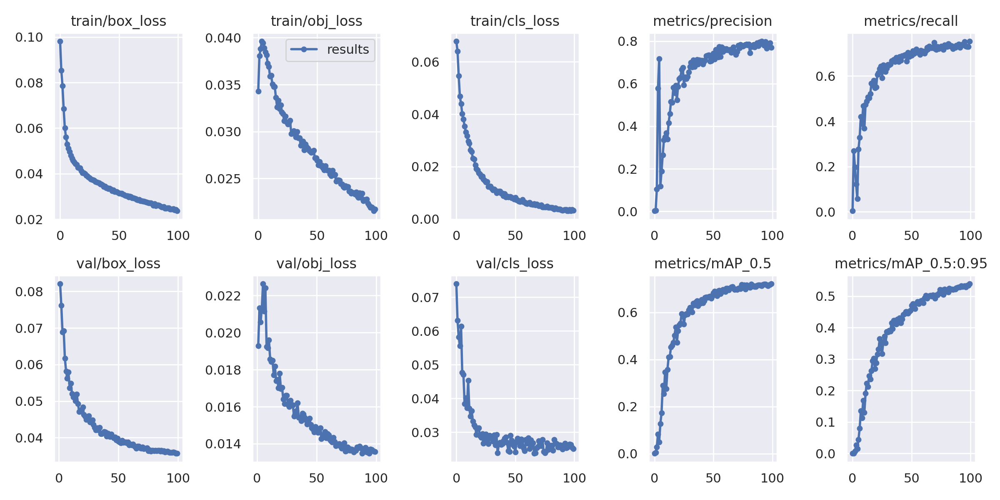

In [33]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
import torch
from IPython.display import Image
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/drive/MyDrive/yolov5setup/yolov5/runs/train/yolov5m_results2/results.png', width = 1000)  # view results.png

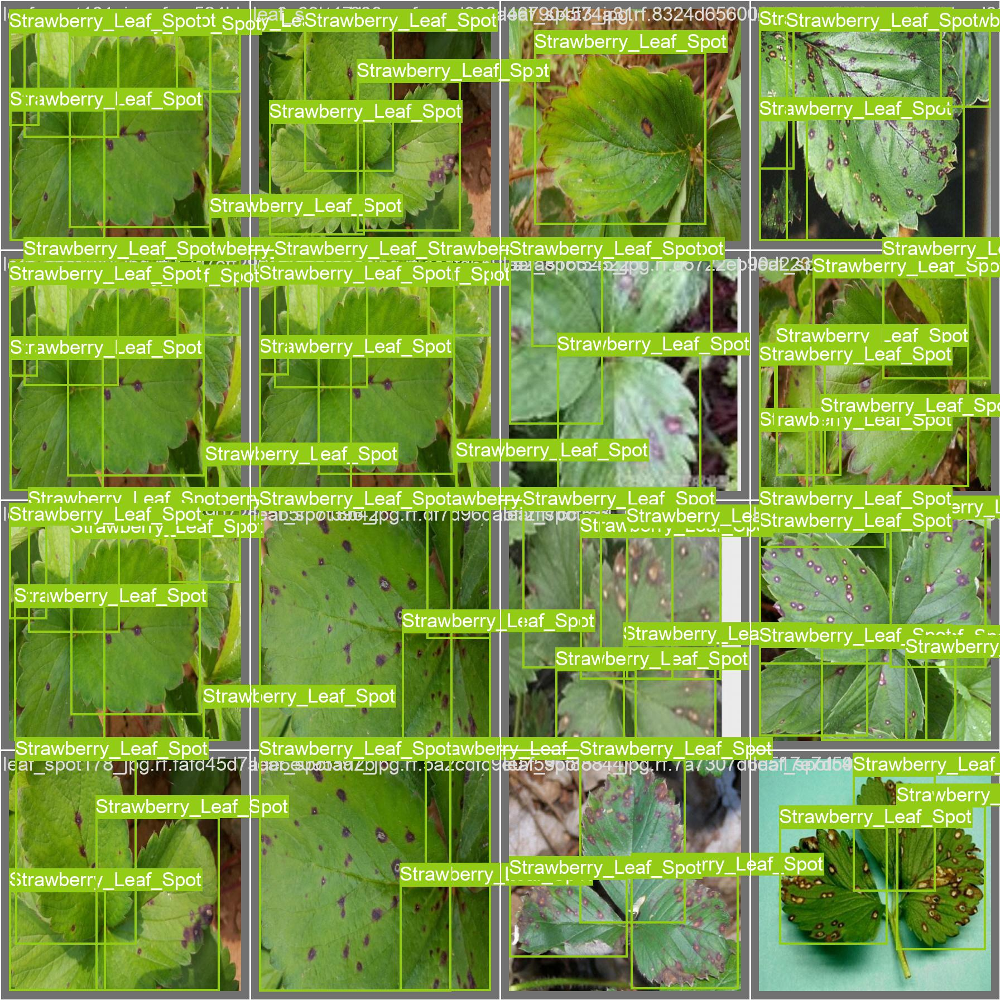

In [35]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/drive/MyDrive/yolov5setup/yolov5/runs/train/yolov5m_results2/val_batch2_labels.jpg', width=1000)  # view results.png

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [36]:
# trained weights are saved by default in our weights folder
%ls runs/

detect/  train/


In [64]:
try:
  %ls /content/drive/MyDrive/yolov5setup/yolov5/runs/train/yolov5m_results2/weights
except Exception as e:
  print(e.with_traceback)

best.pt  last.pt


In [65]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/drive/MyDrive/yolov5setup/yolov5
!python detect.py --weights runs/train/yolov5m_results2/weights/best.pt\
 --img 416 --conf 0.4 --source /content/drive/MyDrive/Yolov5setup/dataset/test/images

/content/drive/MyDrive/yolov5setup/yolov5
detect: weights=['runs/train/yolov5m_results2/weights/best.pt'], source=/content/drive/MyDrive/Yolov5setup/dataset/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-97-gfa4bdbe Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5m summary: 226 layers, 21082089 parameters, 0 gradients
image 1/1163 /content/drive/MyDrive/Yolov5setup/dataset/test/images/030ea180-4eb5-4f91-918e-56c7cfe2c001___Crnl_L-Mold-7076_JPG_jpg.rf.dfa36babe4797d9028fd43bb70bdd986.jpg: 416x416 1 Tomato_Leaf_Mold, 19.1ms
image 2/1163 /content/drive/MyDrive/Yolov5setup/datas

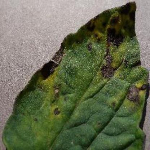

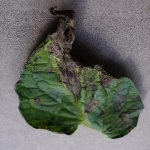

In [94]:
import os
image_list = []
for image in os.listdir('/content/drive/MyDrive/Yolov5setup/dataset/train/images')[0: 2]:
  image_list.append('/content/drive/MyDrive/Yolov5setup/dataset/train/images/'+image)

for image in image_list:
  cv2_imshow(cv2.resize(cv2.imread(image), (150, 150)))

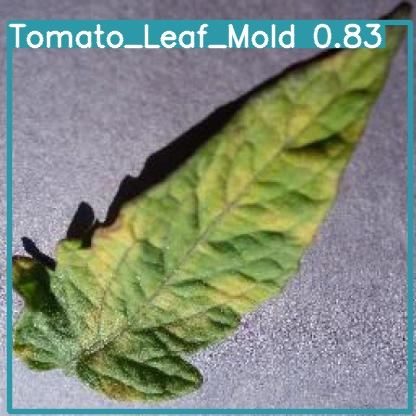

In [66]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display
import matplotlib.pyplot as plt
import cv2
from google.colab.patches import cv2_imshow
list_ = [
    '/content/drive/MyDrive/yolov5setup/yolov5/runs/detect/exp10/5673859a-ec42-4fc0-80ec-44cc3203c7be___Crnl_L-Mold-8768_JPG_jpg.rf.0ddedb23352724d7c771d854c1459181.jpg',
    '/content/drive/MyDrive/yolov5setup/yolov5/runs/detect/exp10/angular_leafspot321_jpg.\
    rf.263469caeb839db6cd49b91625867b2d.jpg',
    '/content/drive/MyDrive/yolov5setup/yolov5/runs/detect/exp10/angular_leafspot302_jpg.\
    rf.f595d59733d2bae373be3c8abb75f1c5.jpg'

]
##### Show the images #####
for image in list_:
  for imageName in glob.glob(image): #assuming JPG
      display(Image(filename=imageName))
      print(end = " ")